In [1]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
import random
from sklearn.cluster import KMeans

In [2]:
'''helper function to display images'''
def display_images(images,titles,row,col):
    fig = plt.figure(figsize = (20,20))
    for i in range(len(images)):
        fig.add_subplot(row,col,i + 1)
        #RGB
        if np.ndim(images[i]) == 3:
            plt.imshow(images[i])
        else:
            plt.imshow(images[i],cmap = 'gray')
        plt.title(titles[i])
        plt.axis("off")
        
        
''' function load a input image,flash image,trimap h for an image and display the images '''
def load_images(index):
    f0 = cv2.imread("./../data_3/" + str(index) + "/noflash.png",cv2.IMREAD_UNCHANGED)
    f1 = cv2.imread("./../data_3/" + str(index) + "/flash.png",cv2.IMREAD_UNCHANGED)
    tm = cv2.imread("./../data_3/" + str(index) + "/trimap.png",cv2.IMREAD_UNCHANGED)
    #print(im.shape,fl.shape,tr.shape)
    f0 = cv2.cvtColor(f0,cv2.COLOR_BGR2RGB)
    f1 = cv2.cvtColor(f1,cv2.COLOR_BGR2RGB)
    f2 = f1 - f0
    #print(f0.shape,f1.shape,f2.shape,tm.shape)
    display_images([f0,f1,f2,tm],["no flash","flash","only flash","trimap"],2,2)
    return f0,f1,f2,tm

''' helper function to divide the trimap into surely foreground and surely background and unknown region'''
def get_maps(trimap):
    bg = np.copy(trimap.astype(np.uint8))
    fg = np.copy(trimap.astype(np.uint8))
    un = np.copy(trimap.astype(np.uint8))
    bg[trimap != 0] = 0
    bg[trimap == 0] = 255
    fg[trimap != 255] = 0
    un[trimap == 125] = 255
    un[trimap != 125] = 0
    return bg,fg,un

''' helper to zero pad the image '''
def pad_image(img,pad_x,pad_y):
    #grayscale
    if(np.ndim(img) == 2):
        (l,b) = img.shape
        new_image = np.zeros((l + 2 * pad_y, b + 2 * pad_x),dtype = np.uint8)
        new_image[pad_y : pad_y + l,pad_x : pad_x + b] = img
        return new_image
    #RGB
    else:
        (l,b,h) = img.shape
        new_image = np.zeros((l + 2 * pad_y, b + 2 * pad_x , h),dtype = np.uint8)
        new_image[pad_y : pad_y + l,pad_x : pad_x + b,:] = img
        return new_image

    ''' create a gaussian kernel of size k with sigma '''
def create_gaussian(k,sigma):
    return np.dot(cv2.getGaussianKernel(k,sigma),cv2.getGaussianKernel(k,sigma).T)


''' helper function to get neighbourhood '''
''' assuming the height and width to be odd for convenience'''
''' to do handle exceptions for now assuming its correct'''
def get_neighbourhood(img,centre_y,centre_x,height ,width ):
    new_centre_y = centre_y + height // 2
    new_centre_x = centre_x + width // 2
    ''' grayscale'''
    #print(np.ndim(img))
    if(np.ndim(img) == 2):
        pad_x = width // 2
        pad_y = height // 2
        padded_img = pad_image(img,pad_x,pad_y)
        (l,b) = img.shape
        left = new_centre_x - width // 2
        right = new_centre_x + width // 2
        up = new_centre_y - height // 2
        down = new_centre_y + height // 2
        if(left < 0 or up < 0 or right >= padded_img.shape[1] or down >= padded_img.shape[1] ):
            ''' for debugging 
            print("Neighbourhood error")
            print("Neighbourhood")
            print(left,right,up,down)
            print("Shapes")
            print(padded_img.shape,img.shape,height,width)
            print("Centre : {0},{1}".format(centre_y,centre_x))
            print("New Centre : {0},{1}".format(new_centre_y,new_centre_x))
            print("Done")
            '''
            print("Invalid indexes for computing neighbourhood")

        return padded_img[up : down + 1,left : right + 1]
   
    elif np.ndim(img) == 3:
        
        (l,b,h) = img.shape
        pad_x = width // 2
        pad_y = height // 2
        padded_img = pad_image(img,pad_x,pad_y)
        left = new_centre_x - width // 2
        right = new_centre_x + width // 2
        up = new_centre_y - height // 2
        down = new_centre_y + height // 2
        if(left < 0 or up < 0 or right >= padded_img.shape[1] or down >= padded_img.shape[1] ):
            ''' for debugging 
            print("Neighbourhood error")
            print("Neighbourhood")
            print(left,right,up,down)
            print("Shapes")
            print(padded_img.shape,img.shape,height,width)
            print("Centre : {0},{1}".format(centre_y,centre_x))
            print("New Centre : {0},{1}".format(new_centre_y,new_centre_x))
            print("Done")
            '''
            print("Invalid indexes for computing neighbourhood")
        return padded_img[up : down + 1,left : right + 1,:]
    
        
    

    
        
    

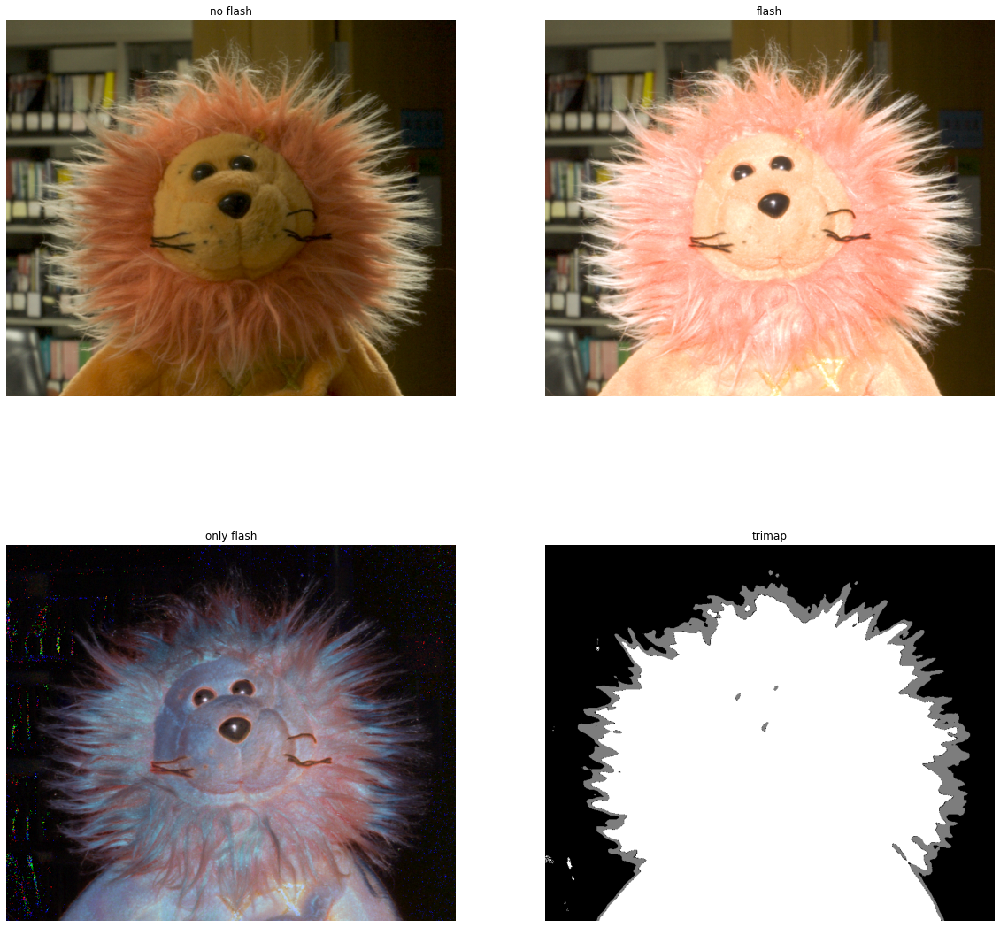

In [50]:
f0,f1,f2,tm = load_images(2)

In [51]:
print(f0.shape)

(658, 785, 3)


In [52]:
#clusters the neighbourhood around a location and tries to compute the mean and convariance for each

def getMeanandCovariance(pixels,kernel,num_cluster = 5):
    #print("MEAN ")
    #print(pixels.shape)
    #shape of the pixels is (N,3) where N is the valid foreground/background pixels
    means = []
    Covs = []
    clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
    labels = np.array(clusters.predict(pixels))
    for i in range(num_cluster):
        group = (labels == i) #truth array of the pixels withing the cluster
        this_pixels = np.asarray(pixels[group]) #pixel values of the cluster
        kernel_bin = np.reshape(kernel[group], (kernel[group].size,1)) #reshape the weights to the this_pixel
        kernel_sqrt = np.sqrt(kernel_bin) # useful for covariance computing

        #compute the weighted mean
        #compute the mean for each channel individually
        meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
                            np.dot(this_pixels[:,2], kernel_bin)])/np.sum(kernel_bin)
        #print("mean shape : {0} this_pixels shape : {1} kernel_bin.shape : {2}".format(meanbin.shape,this_pixels.shape,kernel_bin.shape))
        meanbin = np.reshape(meanbin, (3,))
        means.append(meanbin)

        diff = (this_pixels - meanbin)
        diff = np.multiply(kernel_sqrt, diff)
        covbin = np.eye(3)
        with np.errstate(divide='raise'): # raise errors, but dont stop execution when low number of clusters, and other cases
            try:
                covbin = np.dot(diff.T, diff)/(np.sum(kernel_bin) + 0.00001) + np.eye(3)*(10**(-5)) #adding small value to prevent singular matrices
            except Exception as e:
                print("Error")
                print(covbin.shape)
            #print("Maybe")
            #print(covbin)
        Covs.append(covbin)  
    means = np.array(means).T
    Covs = np.array(cv2.merge(Covs)) #merge 3 channels to 1
    #means have shape (3,K) K is the number of cluster
    #Covs have the shape (3,3,K) where K is the number of cluster
    #print(means.shape,Covs.shape,num_cluster)
    return means, Covs


In [53]:

'''
Solves the matting Equations Iteratively
Choose the best pair of (FG,BG) which maximizes the likelyhood of a given F,B,alpha
returns the value of F,B, alpha
'''
def Solver(f0mean, f0Cov, bgmean, bgCov, f1mean, f1Cov, fmean, lmean, CCov, initial_alpha, minLikelihoodDelta = 10**(-3),maxIterations = 50):

    #means have shape (3,K) K is the number of cluster
    #Covs have the shape (3,3,K) where K is the number of cluster
    #CMean is a [a,b,c]
    #CCov is a scaler
    #initial_Alpha is a float
    #Some global required constants
    z,num_cluster = f0mean.shape
    solved_f0 = np.zeros(3)
    solved_bg = np.zeros(3)
    solved_f1 = np.zeros(3)
    solved_alpha = 0
    I = np.eye(3)
    Z = np.zeros((3,3))
    nIterations = 0
    maxLikelihood = - np.inf
    
    for i in range(num_cluster):
        try:
            invCovF0 = np.linalg.inv(f0Cov[:,:,i]) # compute inverse of the FG convariance matrix
        except Exception as e: # maynot be singular
            print("The Foreground matrix is not singular,Skipping for now")
            continue

        cur_f0mean = f0mean[:, i] #mean of ith FG Cluster 1*3
        
        for j in range(num_cluster):
            try:
                invCovF1 = np.linalg.inv(f1Cov[:,:,j]) # compute inverse of the FG convariance matrix
            except Exception as e: # maynot be singular
                print("The Foreground Flash matrix is not singular,Skipping for now")
                continue

            cur_f1mean = f1mean[:, j] #mean of ith FG Cluster 1*3

            for k in range(num_cluster):
                try:
                    invCovB = np.linalg.inv(bgCov[:,:,k]) # compute inverse of the BG convariance matrix
                except Exception as e: # Sometimes its singular, so we dump the matrix and skip for now!
                    print("The Background matrix is not singular,Skipping for now")
                    continue


                cur_bgmean = bgmean[:, k] #mean of ith BG Cluster

                #Initialization for the iterative solver
                alpha = initial_alpha
                nIterations = 0
                prevLikelihood = -np.inf
                while True:
                    nIterations += 1

                    #SOLVE THE EQUATION DESCRIBED IN THE PAPER

                    #define A
                    a11 = invCovF0 + I*(alpha/CCov)**2  #3X3
                    a12 = I*(alpha*(1-alpha)*(CCov)**2) # 3X3
                    a13 = Z
                    a22 = invCovB + I*((1 - alpha)/CCov)**2 #3X3
                    a33 = invCovF1 + I*(alpha/CCov)**2
                    r1 = np.hstack((a11, a12, a13)) #create the top row 3*9
                    r2 = np.hstack((a12, a22, a13)) # create the middle row 3*9
                    r3 = np.hstack((a13, a13, a33)) #create the bottom row
                    A = np.vstack((r1, r2, r3)) #create the final matrix 6*6

                    #define b
                    b11 = np.dot(invCovF0, cur_f0mean) + fmean*(alpha/CCov**2)  # 3*1
                    b12 = np.dot(invCovB, cur_bgmean) + fmean*(1-alpha)/(CCov**2) # 3*1
                    b13 = np.dot(invCovF1, cur_f1mean) + lmean*(alpha/CCov**2) #3*2
                    b = np.concatenate((b11, b12, b13)).T #(6,)

                    #solve Ax = b
                    try:
                    
                        #print(np.sum(A))
                        #print(np.sum(b))
                        '''
                        print("printing A")
                        for i1 in range(A.shape[0]):for j2 in range(b.shape[0]):
                            print("index {0} : {1}".format(j2,b[j2]))
                            for j1 in range(A.shape[1]):
                                print("index {0},{1} : {2}".format(i1,j1,A[i1,j1]))
                        print("printing B")
                        for j2 in range(b.shape[0]):
                            print("index {0} : {1}".format(j2,b[j2]))
                        '''
                        x = np.linalg.solve(A, b)
                    except Exception as e: # Sometimes there is an issue with solving if A is non invertible. This did not occur after singular matrices were skipped, but is still there for safety.
                        print("ERROR SOLVING")
                        print(e)
                        break


                    #assign f0,f1  and bg that are solved
                    f0Col = x[0:3]
                    bgCol = x[3:6]
                    f1Col = x[6:9]

                    # SOLVE FOR ALPHA using estimated F, B, C       
                    #print("f0Col : {0} bgCol : {1} fmean : {2} lmean : {3} f1col : {4}".
                    #      format(f0Col.shape,bgCol.shape,fmean.shape,lmean.shape,f1Col.shape))
                    num = np.dot((f0Col - bgCol).T, (fmean.T - bgCol)) + np.dot(f1Col.T,lmean)
                    den = np.dot((f0Col - bgCol).T, (f0Col - bgCol)) + np.dot(f1Col.T,f0Col)
                    #print(num/den)
                    alpha = num / den
                    #clip Alpha
                    if alpha < 0:
                          alpha = 0
                    if alpha > 1:
                          alpha = 1


                    # Compute Likelyhood

                    #L[0] = -np.sum((Cmean.T - alpha*fgCol - (1-alpha)*bgCol)**2)/(colCov**2) # L(C|F,B, alpha)
                    L1 = -(np.linalg.norm((fmean.T - alpha*f0Col - (1-alpha)*bgCol),2)**2)/(CCov**2) # L(C|F,B, alpha)
                    L2 = -(np.linalg.norm((lmean.T - alpha*f1Col),2)**2)/(CCov**2) # L(I'|F,, alpha)

                    LF0 = -(np.dot(np.dot((f0Col - cur_f0mean.T).T, invCovF0), (f0Col - cur_f0mean.T).T)/2) #L(F)
                    LF1 = -(np.dot(np.dot((f1Col - cur_f1mean.T).T, invCovF1), (f1Col - cur_f1mean.T).T)/2) #L(F)
                    LB = -(np.dot(np.dot((bgCol - cur_bgmean.T).T, invCovB), (bgCol - cur_bgmean.T).T)/2) #L(B)
                    L = np.array([L1,L2,LF0,LF1,LB])

                    likelihood = np.sum(L)

                    if likelihood > maxLikelihood: # If best likelihood so far, use that
                        solved_alpha = alpha
                        maxLikelihood = likelihood
                        solved_f0 = f0Col
                        solved_f1 = f1Col
                        solved_bg = bgCol

                    # Stop solving if the solver saturates or if it exceeds the maximum number of iterations per cluster pair
                    if abs(prevLikelihood - likelihood) < minLikelihoodDelta or nIterations > maxIterations: # Stop solving
                        break

                    prevLikelihood = likelihood

    return solved_f0, solved_f1 ,solved_bg, solved_alpha

In [54]:
#the main function,has responsible to process the whole Joint Bayesian Matting Algorith
# f0 is the RGB no flash image
# f1 is the RGB flash image
# f2 is the RGB only flash image given by f2 = f1 - f0
# trimap is the trimap generated by our code.
# threshold is the number of known pixels in the neighbourhood for to proceed with solving 

def solve(f0,f1,f2,tm,thresh = 10):
    #print(f0.shape,f1.shape,f2.shape,tm.shape)
    # get the regions for each type
    bg,fg,unk = get_maps(tm)
    y,x = np.where(unk != 0) # locations where classification is unknown
    unsolved_loc = list(set(zip(y,x)))
    unsolved_loc = sorted(unsolved_loc,key = lambda x : x[0]) #top to bottom
    total = len(unsolved_loc)
    # this is essentially the alpha matrix
    # 1 for foreground pixels
    # 0 for background pixels
    # nan for unknowns.
    mask = np.copy(unk).astype(np.float64)
    
   
    
    mask[unk != 0] = np.nan #replace unknown regions with nan
    mask[fg != 0] = 1 #replace foreground region with 1
    
    
    
    #convert fg to RGB

    fg1 = np.zeros((f0.shape))
    fg1[:,:,0] = fg
    fg1[:,:,1] = fg
    fg1[:,:,2] = fg
    #convert bg to RGB for bitwise operations
    bg1 = np.zeros((f0.shape))
    bg1[:,:,0] = bg
    bg1[:,:,1] = bg
    bg1[:,:,2] = bg
    
    #convert fg to RGB for bitwise
    fg2 = np.zeros(f1.shape)
    fg2[:,:,0] = fg
    fg2[:,:,1] = fg
    fg2[:,:,2] = fg

    #generate surely background and surely foreground images
    f = cv2.bitwise_and(fg1.astype(np.uint8),f0.astype(np.uint8))
    b = cv2.bitwise_and(bg1.astype(np.uint8),f0.astype(np.uint8))
    l = cv2.bitwise_and(fg2.astype(np.uint8),f2.astype(np.uint8))
    
    #display_images([f,b,im],["foreground","background","original"],3,1)
    
    iteration = 0
    solved = []
    tosolve = np.copy(unsolved_loc)
    pass_num = 0
    pass_thresh = 5 # after this threshold,window size need to be increased
    window_size = 19 # neighbourhood is (19,19)
    sigma = 10
    print("Unsolve : {0}".format(len(unsolved_loc)))
    while(len(tosolve) > 0 and pass_num <10):
        pass_num += 1
        tosolve = []
        #create a list of locations to be solved
        for loc in unsolved_loc :
            #check it is not already solved
            if loc not in solved:
                tosolve.append(loc)
        if len(tosolve) == 0:
            break
        if pass_num > pass_thresh and pass_num % 3:
            window_size += 2 #initally odd,remains odd.Window size increases when too many unknowns
        print("PASS NUMBER : {0} , WINDOW SIZE : {1} , TO SOLVE : {2}".format(pass_num,window_size,len(tosolve)))
        print(np.count_nonzero(np.isnan(mask)))
#         print(np.count_nonzero(np.isnan(f)))
#         print(np.count_nonzero(np.isnan(b)))
        for loc in tosolve:
            gaussian_kernel = create_gaussian(window_size,sigma) #create kernel
            alpha = get_neighbourhood(mask,loc[0],loc[1],window_size,window_size)
            
            #find  fg pixels for clustering non flash
            kernel_f0 = np.multiply(np.square(alpha),gaussian_kernel)
            f0_window = get_neighbourhood(f,loc[0],loc[1],window_size,window_size)
            known = np.nan_to_num(kernel_f0) > 0 #return a boolean array with true values for non-zero and non-nan values
            f0_pixel = f0_window[known] #extract the selected pixel location
            kernel_f0 = kernel_f0[known] # extract the selected pixel location
            
            #find  fg pixels for clustering flash
            kernel_f1 = np.multiply(np.square(alpha),gaussian_kernel)
            f1_window = get_neighbourhood(l,loc[0],loc[1],window_size,window_size)
            known = np.nan_to_num(kernel_f1) > 0 #return a boolean array with true values for non-zero and non-nan values
            f1_pixel = f1_window[known] #extract the selected pixel location
            kernel_f1 = kernel_f1[known] # extract the selected pixel location
            
            #find  bg pixels for clustering
            kernel_b = np.multiply(np.square(1- alpha),gaussian_kernel)
            bg_window = get_neighbourhood(b,loc[0],loc[1],window_size,window_size)
            known = np.nan_to_num(kernel_b) > 0 #return a boolean array with true values for non-zero and non-nan values
            bg_pixel = bg_window[known] #extract the selected pixel location
            kernel_b = kernel_b[known] # extract the selected pixel location
            
          
            
            #check sufficient data to solve the proble
            if len(f1_pixel) >= thresh and len(bg_pixel) >= thresh and len(f1_pixel) >= thresh:
                    

                f0mean,f0Cov = getMeanandCovariance(f0_pixel,kernel_f0,num_cluster = 3)
                f1mean,f1Cov = getMeanandCovariance(f1_pixel,kernel_f1,num_cluster = 3)
                bgmean,bgCov = getMeanandCovariance(bg_pixel,kernel_b,num_cluster = 3)
                
                #observed_c
                fmean = f0[loc[0],loc[1],:]
                lmean = f1[loc[0],loc[1],:]
                CCov = 3 #tunable parameter
                #print(Cmean,CCov)
                
                #take intial guess as mean
                initial_alpha = np.nanmean(alpha)
                
                #print(initial_alpha)
                
                
                #iteratively solve!
                final_f0, final_f1, final_bg , final_alpha = Solver(f0mean, f0Cov, bgmean, bgCov, f1mean, f1Cov, fmean, lmean, CCov, initial_alpha, maxIterations = 50)


                #update the estimated values
                
                #print(final_fg,final_bg,final_alpha)
                mask[loc[0],loc[1]] = final_alpha
                f[loc[0],loc[1],:] = np.array(final_f0)
                b[loc[0],loc[1],:] = np.array(final_bg)
                l[loc[0],loc[1],:] = np.array(final_f1)
                solved.append(loc)


                #print occasional status updates
                if iteration % 50 == 0:
                    print("PASS : ", pass_num)
                    print(np.count_nonzero(np.isnan(mask)))
#                     print(np.count_nonzero(np.isnan(f)))
#                     print(np.count_nonzero(np.isnan(b)))
                    print("WINDOW SIZE = ", window_size)
                    print('SOLVED LOCATIONS = ', len(solved))
                    print('REMAINING LOCATIONS = ', total - len(solved))
                    #sad = np.sum(np.absolute((cv2.cvtColor(gt, cv2.COLOR_BGR2GRAY)/255).astype(np.float) - np.nan_to_num(mask)))
                    #print('SAD = ', sad)
                    print('---------------------------------------------')
                    final_alpha = cv2.cvtColor((mask*255).astype(np.uint8), cv2.COLOR_GRAY2BGR) #3 c
                    #showMultiImages((fg, bg, gt, alpha3channel), 'CURRENT')


                iteration += 1
                
    #sad = np.sum(np.absolute((cv2.cvtColor(gt, cv2.COLOR_BGR2GRAY )/255).astype(np.float) - np.nan_to_num(mask)))
    print('SOLVER COMPLETED IN ', iteration, 'ITERATIONS')
    print('---------------------------------------------')
    print('---------------------------------------------')
    print('---------------------------------------------')


    return f, b, l,mask
                
                
            
            
            
        
    
    

In [55]:
def scale(im,sc):
    return cv2.resize(np.copy(im),(0,0),fx = sc,fy = sc)

In [56]:
def run(index):
    import time
    t1 = time.time()
    f0,f1,f2,tm = load_images(index)
#     f0 = scale(np.copy(f0),0.5)
#     f1 = scale(np.copy(f1),0.5)
#     f2 = scale(np.copy(f2),0.5)
#     tm = scale(np.copy(tm),0.5)
    f,b,l,mask = solve(f0,f1,f2,tm,thresh = 10)
    t2 = time.time()
    print("Time taken : {0}".format(t2 -t1))
    return f,b,l,mask


Unsolve : 27830
PASS NUMBER : 1 , WINDOW SIZE : 19 , TO SOLVE : 27830
27830
PASS :  1
27829
WINDOW SIZE =  19
SOLVED LOCATIONS =  1
REMAINING LOCATIONS =  27829
---------------------------------------------
PASS :  1
27779
WINDOW SIZE =  19
SOLVED LOCATIONS =  51
REMAINING LOCATIONS =  27779
---------------------------------------------
PASS :  1
27729
WINDOW SIZE =  19
SOLVED LOCATIONS =  101
REMAINING LOCATIONS =  27729
---------------------------------------------
PASS :  1
27679
WINDOW SIZE =  19
SOLVED LOCATIONS =  151
REMAINING LOCATIONS =  27679
---------------------------------------------
PASS :  1
27629
WINDOW SIZE =  19
SOLVED LOCATIONS =  201
REMAINING LOCATIONS =  27629
---------------------------------------------
PASS :  1
27579
WINDOW SIZE =  19
SOLVED LOCATIONS =  251
REMAINING LOCATIONS =  27579
---------------------------------------------
PASS :  1
27529
WINDOW SIZE =  19
SOLVED LOCATIONS =  301
REMAINING LOCATIONS =  27529
------------------------------------------

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
27429
WINDOW SIZE =  19
SOLVED LOCATIONS =  401
REMAINING LOCATIONS =  27429
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
27379
WINDOW SIZE =  19
SOLVED LOCATIONS =  451
REMAINING LOCATIONS =  27379
---------------------------------------------
PASS :  1
27329
WINDOW SIZE =  19
SOLVED LOCATIONS =  501
REMAINING LOCATIONS =  27329
---------------------------------------------
PASS :  1
27279
WINDOW SIZE =  19
SOLVED LOCATIONS =  551
REMAINING LOCATIONS =  27279
---------------------------------------------
PASS :  1
27229
WINDOW SIZE =  19
SOLVED LOCATIONS =  601
REMAINING LOCATIONS =  27229
---------------------------------------------
PASS :  1
27179
WINDOW SIZE =  19
SOLVED LOCATIONS =  651
REMAINING LOCATIONS =  27179
---------------------------------------------
PASS :  1
27129
WINDOW SIZE =  19
SOLVED LOCATIONS =  701
REMAINING LOCATIONS =  27129
---------------------------------------------
PASS :  1
27079
WINDOW SIZE =  19
SOLVED LOCATIONS =  751
REMAINING LOCATIONS =  27079
---------------------------------------------
PASS :  1
27029
WINDOW SIZE =  19
SOLVED LOCATIONS =  801
REMAINING L

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
24279
WINDOW SIZE =  19
SOLVED LOCATIONS =  3551
REMAINING LOCATIONS =  24279
---------------------------------------------
PASS :  1
24229
WINDOW SIZE =  19
SOLVED LOCATIONS =  3601
REMAINING LOCATIONS =  24229
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
24179
WINDOW SIZE =  19
SOLVED LOCATIONS =  3651
REMAINING LOCATIONS =  24179
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
24129
WINDOW SIZE =  19
SOLVED LOCATIONS =  3701
REMAINING LOCATIONS =  24129
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
24079
WINDOW SIZE =  19
SOLVED LOCATIONS =  3751
REMAINING LOCATIONS =  24079
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
24029
WINDOW SIZE =  19
SOLVED LOCATIONS =  3801
REMAINING LOCATIONS =  24029
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23979
WINDOW SIZE =  19
SOLVED LOCATIONS =  3851
REMAINING LOCATIONS =  23979
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23929
WINDOW SIZE =  19
SOLVED LOCATIONS =  3901
REMAINING LOCATIONS =  23929
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23879
WINDOW SIZE =  19
SOLVED LOCATIONS =  3951
REMAINING LOCATIONS =  23879
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23829
WINDOW SIZE =  19
SOLVED LOCATIONS =  4001
REMAINING LOCATIONS =  23829
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23779
WINDOW SIZE =  19
SOLVED LOCATIONS =  4051
REMAINING LOCATIONS =  23779
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23729
WINDOW SIZE =  19
SOLVED LOCATIONS =  4101
REMAINING LOCATIONS =  23729
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23679
WINDOW SIZE =  19
SOLVED LOCATIONS =  4151
REMAINING LOCATIONS =  23679
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
23629
WINDOW SIZE =  19
SOLVED LOCATIONS =  4201
REMAINING LOCATIONS =  23629
---------------------------------------------
PASS :  1
23579
WINDOW SIZE =  19
SOLVED LOCATIONS =  4251
REMAINING LOCATIONS =  23579
---------------------------------------------
PASS :  1
23529
WINDOW SIZE =  19
SOLVED LOCATIONS =  4301
REMAINING LOCATIONS =  23529
---------------------------------------------
PASS :  1
23479
WINDOW SIZE =  19
SOLVED LOCATIONS =  4351
REMAINING LOCATIONS =  23479
---------------------------------------------
PASS :  1
23429
WINDOW SIZE =  19
SOLVED LOCATIONS =  4401
REMAINING LOCATIONS =  23429
---------------------------------------------
PASS :  1
23379
WINDOW SIZE =  19
SOLVED LOCATIONS =  4451
REMAINING LOCATIONS =  23379
---------------------------------------------
PASS :  1
23329
WINDOW SIZE =  19
SOLVED LOCATIONS =  4501
REMAINING LOCATIONS =  23329
---------------------------------------------
PASS :  1
23279
WINDOW SIZE =  19
SOLVED LOCATIONS =  4551
REM

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
18179
WINDOW SIZE =  19
SOLVED LOCATIONS =  9651
REMAINING LOCATIONS =  18179
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
18129
WINDOW SIZE =  19
SOLVED LOCATIONS =  9701
REMAINING LOCATIONS =  18129
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
18079
WINDOW SIZE =  19
SOLVED LOCATIONS =  9751
REMAINING LOCATIONS =  18079
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
18029
WINDOW SIZE =  19
SOLVED LOCATIONS =  9801
REMAINING LOCATIONS =  18029
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
17979
WINDOW SIZE =  19
SOLVED LOCATIONS =  9851
REMAINING LOCATIONS =  17979
---------------------------------------------
PASS :  1
17929
WINDOW SIZE =  19
SOLVED LOCATIONS =  9901
REMAINING LOCATIONS =  17929
---------------------------------------------
PASS :  1
17879
WINDOW SIZE =  19
SOLVED LOCATIONS =  9951
REMAINING LOCATIONS =  17879
---------------------------------------------
PASS :  1
17829
WINDOW SIZE =  19
SOLVED LOCATIONS =  10001
REMAINING LOCATIONS =  17829
---------------------------------------------
PASS :  1
17779
WINDOW SIZE =  19
SOLVED LOCATIONS =  10051
REMAINING LOCATIONS =  17779
---------------------------------------------
PASS :  1
17729
WINDOW SIZE =  19
SOLVED LOCATIONS =  10101
REMAINING LOCATIONS =  17729
---------------------------------------------
PASS :  1
17679
WINDOW SIZE =  19
SOLVED LOCATIONS =  10151
REMAINING LOCATIONS =  17679
---------------------------------------------
PASS :  1
17629
WINDOW SIZE =  19
SOLVED LOCATIONS =  1020

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
17179
WINDOW SIZE =  19
SOLVED LOCATIONS =  10651
REMAINING LOCATIONS =  17179
---------------------------------------------
PASS :  1
17129
WINDOW SIZE =  19
SOLVED LOCATIONS =  10701
REMAINING LOCATIONS =  17129
---------------------------------------------
PASS :  1
17079
WINDOW SIZE =  19
SOLVED LOCATIONS =  10751
REMAINING LOCATIONS =  17079
---------------------------------------------
PASS :  1
17029
WINDOW SIZE =  19
SOLVED LOCATIONS =  10801
REMAINING LOCATIONS =  17029
---------------------------------------------
PASS :  1
16979
WINDOW SIZE =  19
SOLVED LOCATIONS =  10851
REMAINING LOCATIONS =  16979
---------------------------------------------
PASS :  1
16929
WINDOW SIZE =  19
SOLVED LOCATIONS =  10901
REMAINING LOCATIONS =  16929
---------------------------------------------
PASS :  1
16879
WINDOW SIZE =  19
SOLVED LOCATIONS =  10951
REMAINING LOCATIONS =  16879
---------------------------------------------
PASS :  1
16829
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
15629
WINDOW SIZE =  19
SOLVED LOCATIONS =  12201
REMAINING LOCATIONS =  15629
---------------------------------------------
PASS :  1
15579
WINDOW SIZE =  19
SOLVED LOCATIONS =  12251
REMAINING LOCATIONS =  15579
---------------------------------------------
PASS :  1
15529
WINDOW SIZE =  19
SOLVED LOCATIONS =  12301
REMAINING LOCATIONS =  15529
---------------------------------------------
PASS :  1
15479
WINDOW SIZE =  19
SOLVED LOCATIONS =  12351
REMAINING LOCATIONS =  15479
---------------------------------------------
PASS :  1
15429
WINDOW SIZE =  19
SOLVED LOCATIONS =  12401
REMAINING LOCATIONS =  15429
---------------------------------------------
PASS :  1
15379
WINDOW SIZE =  19
SOLVED LOCATIONS =  12451
REMAINING LOCATIONS =  15379
---------------------------------------------
PASS :  1
15329
WINDOW SIZE =  19
SOLVED LOCATIONS =  12501
REMAINING LOCATIONS =  15329
---------------------------------------------
PASS :  1
15279
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14879
WINDOW SIZE =  19
SOLVED LOCATIONS =  12951
REMAINING LOCATIONS =  14879
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14829
WINDOW SIZE =  19
SOLVED LOCATIONS =  13001
REMAINING LOCATIONS =  14829
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14779
WINDOW SIZE =  19
SOLVED LOCATIONS =  13051
REMAINING LOCATIONS =  14779
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14729
WINDOW SIZE =  19
SOLVED LOCATIONS =  13101
REMAINING LOCATIONS =  14729
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14679
WINDOW SIZE =  19
SOLVED LOCATIONS =  13151
REMAINING LOCATIONS =  14679
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14629
WINDOW SIZE =  19
SOLVED LOCATIONS =  13201
REMAINING LOCATIONS =  14629
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14579
WINDOW SIZE =  19
SOLVED LOCATIONS =  13251
REMAINING LOCATIONS =  14579
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14529
WINDOW SIZE =  19
SOLVED LOCATIONS =  13301
REMAINING LOCATIONS =  14529
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14479
WINDOW SIZE =  19
SOLVED LOCATIONS =  13351
REMAINING LOCATIONS =  14479
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14429
WINDOW SIZE =  19
SOLVED LOCATIONS =  13401
REMAINING LOCATIONS =  14429
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14379
WINDOW SIZE =  19
SOLVED LOCATIONS =  13451
REMAINING LOCATIONS =  14379
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
14329
WINDOW SIZE =  19
SOLVED LOCATIONS =  13501
REMAINING LOCATIONS =  14329
---------------------------------------------
PASS :  1
14279
WINDOW SIZE =  19
SOLVED LOCATIONS =  13551
REMAINING LOCATIONS =  14279
---------------------------------------------
PASS :  1
14229
WINDOW SIZE =  19
SOLVED LOCATIONS =  13601
REMAINING LOCATIONS =  14229
---------------------------------------------
PASS :  1
14179
WINDOW SIZE =  19
SOLVED LOCATIONS =  13651
REMAINING LOCATIONS =  14179
---------------------------------------------
PASS :  1
14129
WINDOW SIZE =  19
SOLVED LOCATIONS =  13701
REMAINING LOCATIONS =  14129
---------------------------------------------
PASS :  1
14079
WINDOW SIZE =  19
SOLVED LOCATIONS =  13751
REMAINING LOCATIONS =  14079
---------------------------------------------
PASS :  1
14029
WINDOW SIZE =  19
SOLVED LOCATIONS =  13801
REMAINING LOCATIONS =  14029
---------------------------------------------
PASS :  1
13979
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13229
WINDOW SIZE =  19
SOLVED LOCATIONS =  14601
REMAINING LOCATIONS =  13229
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
13179
WINDOW SIZE =  19
SOLVED LOCATIONS =  14651
REMAINING LOCATIONS =  13179
---------------------------------------------
PASS :  1
13129
WINDOW SIZE =  19
SOLVED LOCATIONS =  14701
REMAINING LOCATIONS =  13129
---------------------------------------------
PASS :  1
13079
WINDOW SIZE =  19
SOLVED LOCATIONS =  14751
REMAINING LOCATIONS =  13079
---------------------------------------------
PASS :  1
13029
WINDOW SIZE =  19
SOLVED LOCATIONS =  14801
REMAINING LOCATIONS =  13029
---------------------------------------------
PASS :  1
12979
WINDOW SIZE =  19
SOLVED LOCATIONS =  14851
REMAINING LOCATIONS =  12979
---------------------------------------------
PASS :  1
12929
WINDOW SIZE =  19
SOLVED LOCATIONS =  14901
REMAINING LOCATIONS =  12929
---------------------------------------------
PASS :  1
12879
WINDOW SIZE =  19
SOLVED LOCATIONS =  14951
REMAINING LOCATIONS =  12879
---------------------------------------------
PASS :  1
12829
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9579
WINDOW SIZE =  19
SOLVED LOCATIONS =  18251
REMAINING LOCATIONS =  9579
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9529
WINDOW SIZE =  19
SOLVED LOCATIONS =  18301
REMAINING LOCATIONS =  9529
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9479
WINDOW SIZE =  19
SOLVED LOCATIONS =  18351
REMAINING LOCATIONS =  9479
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
9429
WINDOW SIZE =  19
SOLVED LOCATIONS =  18401
REMAINING LOCATIONS =  9429
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9379
WINDOW SIZE =  19
SOLVED LOCATIONS =  18451
REMAINING LOCATIONS =  9379
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9329
WINDOW SIZE =  19
SOLVED LOCATIONS =  18501
REMAINING LOCATIONS =  9329
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9279
WINDOW SIZE =  19
SOLVED LOCATIONS =  18551
REMAINING LOCATIONS =  9279
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9229
WINDOW SIZE =  19
SOLVED LOCATIONS =  18601
REMAINING LOCATIONS =  9229
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9179
WINDOW SIZE =  19
SOLVED LOCATIONS =  18651
REMAINING LOCATIONS =  9179
---------------------------------------------
PASS :  1
9129
WINDOW SIZE =  19
SOLVED LOCATIONS =  18701
REMAINING LOCATIONS =  9129
---------------------------------------------
PASS :  1
9079
WINDOW SIZE =  19
SOLVED LOCATIONS =  18751
REMAINING LOCATIONS =  9079
---------------------------------------------
PASS :  1
9029
WINDOW SIZE =  19
SOLVED LOCATIONS =  18801
REMAINING LOCATIONS =  9029
---------------------------------------------
PASS :  1
8979
WINDOW SIZE =  19
SOLVED LOCATIONS =  18851
REMAINING LOCATIONS =  8979
---------------------------------------------
PASS :  1
8929
WINDOW SIZE =  19
SOLVED LOCATIONS =  18901
REMAINING LOCATIONS =  8929
---------------------------------------------
PASS :  1
8879
WINDOW SIZE =  19
SOLVED LOCATIONS =  18951
REMAINING LOCATIONS =  8879
---------------------------------------------
PASS :  1
8829
WINDOW SIZE =  19
SOLVED LOCATIONS =  19001
REMAINING 

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
6929
WINDOW SIZE =  19
SOLVED LOCATIONS =  20901
REMAINING LOCATIONS =  6929
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
6879
WINDOW SIZE =  19
SOLVED LOCATIONS =  20951
REMAINING LOCATIONS =  6879
---------------------------------------------
PASS :  1
6829
WINDOW SIZE =  19
SOLVED LOCATIONS =  21001
REMAINING LOCATIONS =  6829
---------------------------------------------
PASS :  1
6779
WINDOW SIZE =  19
SOLVED LOCATIONS =  21051
REMAINING LOCATIONS =  6779
---------------------------------------------
PASS :  1
6729
WINDOW SIZE =  19
SOLVED LOCATIONS =  21101
REMAINING LOCATIONS =  6729
---------------------------------------------
PASS :  1
6679
WINDOW SIZE =  19
SOLVED LOCATIONS =  21151
REMAINING LOCATIONS =  6679
---------------------------------------------
PASS :  1
6629
WINDOW SIZE =  19
SOLVED LOCATIONS =  21201
REMAINING LOCATIONS =  6629
---------------------------------------------
PASS :  1
6579
WINDOW SIZE =  19
SOLVED LOCATIONS =  21251
REMAINING LOCATIONS =  6579
---------------------------------------------
PASS :  1
6529
WINDOW SIZE =  19
SOLVED LOCATIONS =  21301
REMAINING 

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
2829
WINDOW SIZE =  19
SOLVED LOCATIONS =  25001
REMAINING LOCATIONS =  2829
---------------------------------------------
PASS :  1
2779
WINDOW SIZE =  19
SOLVED LOCATIONS =  25051
REMAINING LOCATIONS =  2779
---------------------------------------------
PASS :  1
2729
WINDOW SIZE =  19
SOLVED LOCATIONS =  25101
REMAINING LOCATIONS =  2729
---------------------------------------------
PASS :  1
2679
WINDOW SIZE =  19
SOLVED LOCATIONS =  25151
REMAINING LOCATIONS =  2679
---------------------------------------------
PASS :  1
2629
WINDOW SIZE =  19
SOLVED LOCATIONS =  25201
REMAINING LOCATIONS =  2629
---------------------------------------------
PASS :  1
2579
WINDOW SIZE =  19
SOLVED LOCATIONS =  25251
REMAINING LOCATIONS =  2579
---------------------------------------------
PASS :  1
2529
WINDOW SIZE =  19
SOLVED LOCATIONS =  25301
REMAINING LOCATIONS =  2529
---------------------------------------------
PASS :  1
2479
WINDOW SIZE =  19
SOLVED LOCATIONS =  25351
REMAINING 

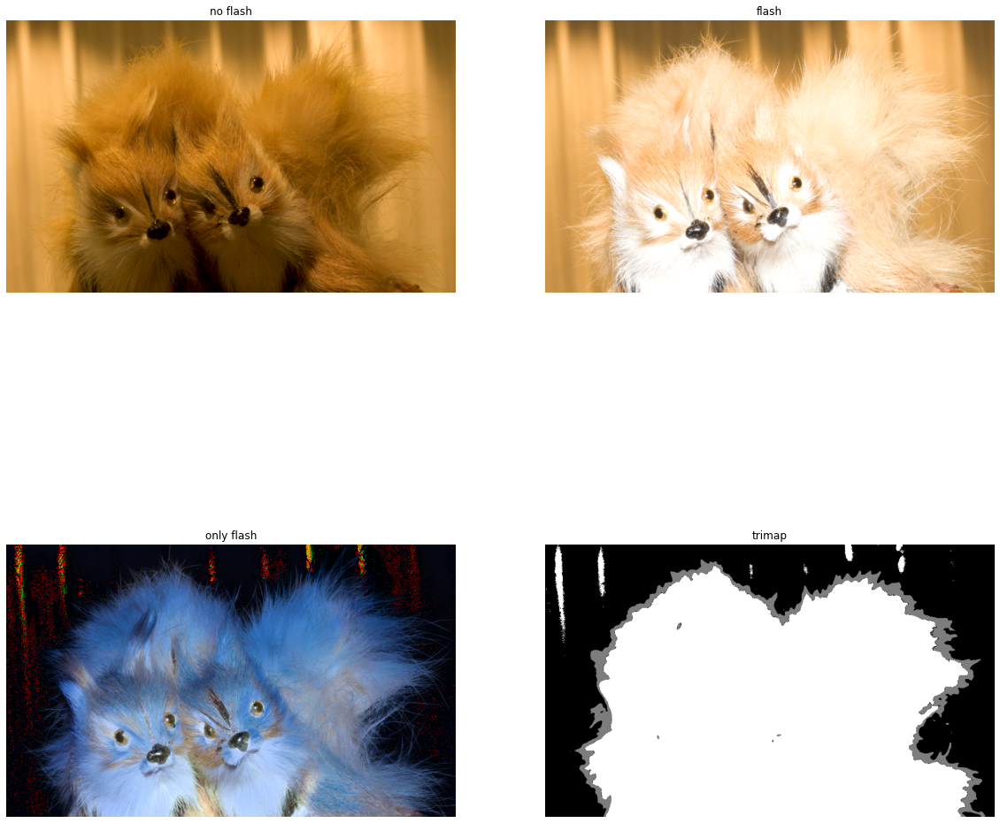

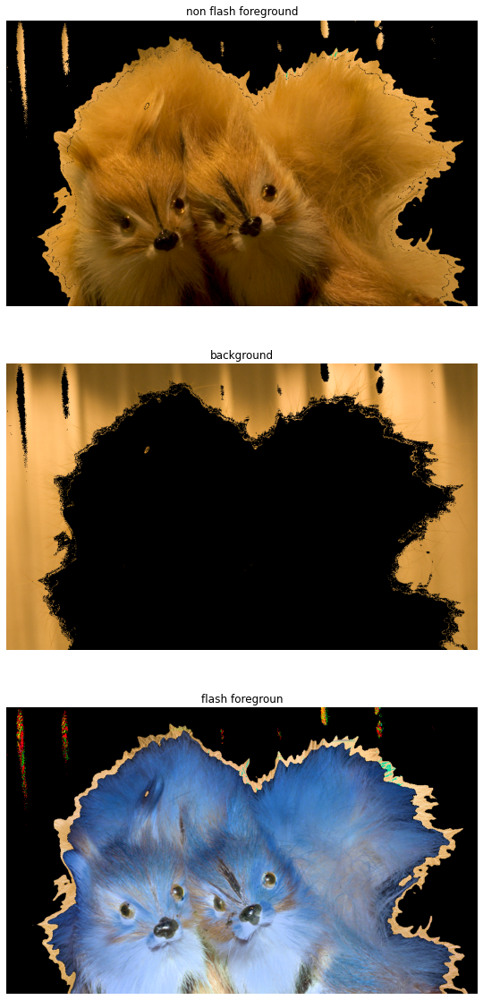

In [57]:
f,b,l,mask = run(2)
display_images([f,b,l],["non flash foreground","background","flash foregroun"],3,1)

In [34]:
np.unique(mask)

array([0.        , 0.74809565, 0.79922294, 0.81460418, 0.82375438,
       0.82898002, 0.83576867, 0.84218158, 0.86116393, 0.86367817,
       0.8650464 , 0.87782042, 0.88005273, 0.88021342, 0.88413537,
       0.88701821, 0.88836764, 0.88900693, 0.88929842, 0.88957418,
       0.89320473, 0.89333878, 0.89372263, 0.89422861, 0.89509743,
       0.89652443, 0.89668211, 0.89681234, 0.89736955, 0.89976403,
       0.90051434, 0.90137856, 0.90399243, 0.90406683, 0.90530687,
       0.9084829 , 0.90944748, 0.90990089, 0.91334618, 0.91471696,
       0.91859119, 0.9202572 , 0.92046812, 0.92092422, 0.92385901,
       0.9276958 , 0.92773398, 0.92922422, 0.93052227, 0.93065517,
       0.93351198, 0.93367354, 0.93422654, 0.93437687, 0.9350866 ,
       0.93780374, 0.93894689, 0.94277587, 0.954752  , 0.95487502,
       0.95585366, 0.95703682, 0.95827667, 0.96046208, 0.96133102,
       0.96281278, 0.96358798, 0.963761  , 0.96799016, 0.96824062,
       0.96994006, 0.9718179 , 0.9719628 , 0.97201463, 0.97303

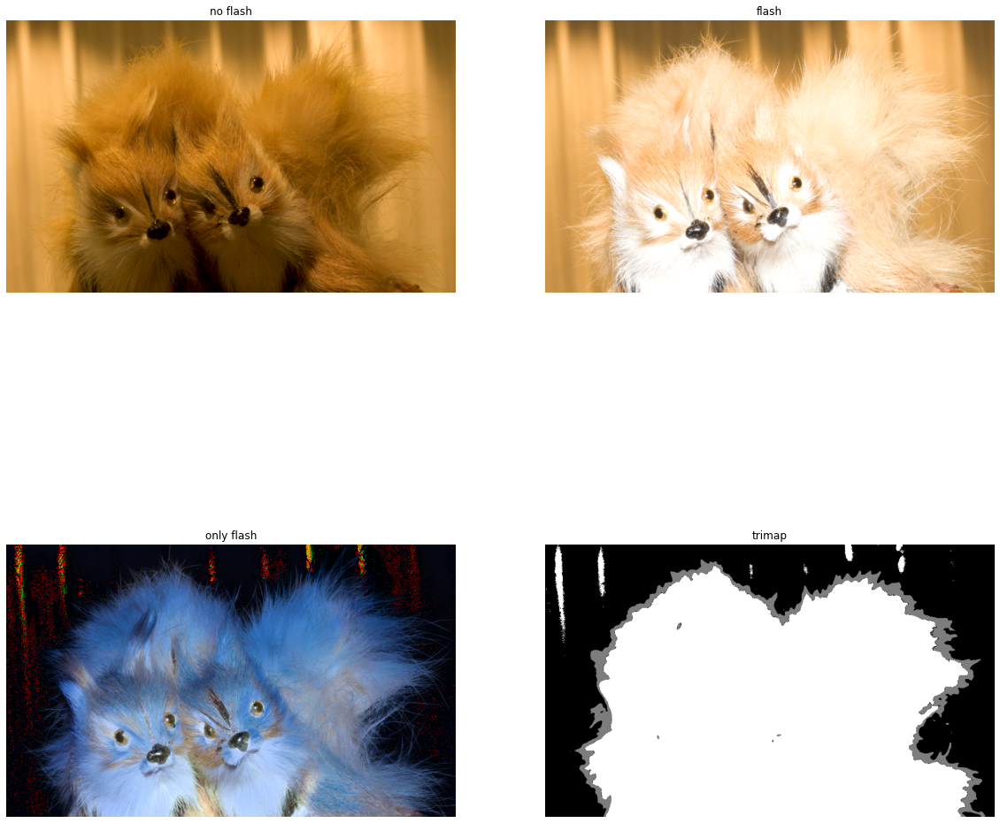

In [44]:
f0,f1,f2,tm = load_images(1)


(573, 943) (573, 943, 3)


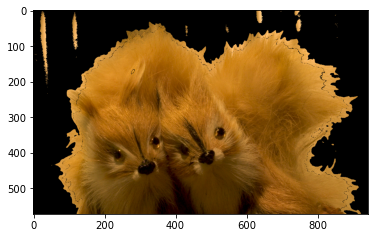

In [46]:
# f0 = scale(np.copy(f0),1)
final_image = np.copy(f0)
print(mask.shape,final_image.shape)
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if(mask[i,j] <= 0.75):
            final_image[i,j,:] = 0
plt.imshow(final_image)


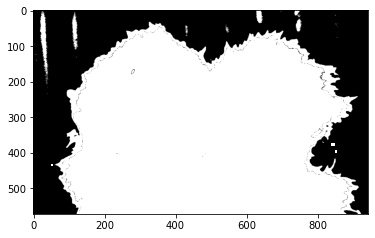

In [47]:
plt.imshow(mask,cmap = "gray")

In [48]:
cv2.imwrite("1.png",final_image)

True

In [49]:
cv2.imwrite("mask_1.png",mask)

True

Unsolve : 35074
PASS NUMBER : 1 , WINDOW SIZE : 19 , TO SOLVE : 35074
35074
PASS :  1
35073
WINDOW SIZE =  19
SOLVED LOCATIONS =  1
REMAINING LOCATIONS =  35073
---------------------------------------------
PASS :  1
35023
WINDOW SIZE =  19
SOLVED LOCATIONS =  51
REMAINING LOCATIONS =  35023
---------------------------------------------
PASS :  1
34973
WINDOW SIZE =  19
SOLVED LOCATIONS =  101
REMAINING LOCATIONS =  34973
---------------------------------------------
PASS :  1
34923
WINDOW SIZE =  19
SOLVED LOCATIONS =  151
REMAINING LOCATIONS =  34923
---------------------------------------------
PASS :  1
34873
WINDOW SIZE =  19
SOLVED LOCATIONS =  201
REMAINING LOCATIONS =  34873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
34823
WINDOW SIZE =  19
SOLVED LOCATIONS =  251
REMAINING LOCATIONS =  34823
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
34773
WINDOW SIZE =  19
SOLVED LOCATIONS =  301
REMAINING LOCATIONS =  34773
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
34723
WINDOW SIZE =  19
SOLVED LOCATIONS =  351
REMAINING LOCATIONS =  34723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
34673
WINDOW SIZE =  19
SOLVED LOCATIONS =  401
REMAINING LOCATIONS =  34673
---------------------------------------------
PASS :  1
34623
WINDOW SIZE =  19
SOLVED LOCATIONS =  451
REMAINING LOCATIONS =  34623
---------------------------------------------
PASS :  1
34573
WINDOW SIZE =  19
SOLVED LOCATIONS =  501
REMAINING LOCATIONS =  34573
---------------------------------------------
PASS :  1
34523
WINDOW SIZE =  19
SOLVED LOCATIONS =  551
REMAINING LOCATIONS =  34523
---------------------------------------------
PASS :  1
34473
WINDOW SIZE =  19
SOLVED LOCATIONS =  601
REMAINING LOCATIONS =  34473
---------------------------------------------
PASS :  1
34423
WINDOW SIZE =  19
SOLVED LOCATIONS =  651
REMAINING LOCATIONS =  34423
---------------------------------------------
PASS :  1
34373
WINDOW SIZE =  19
SOLVED LOCATIONS =  701
REMAINING LOCATIONS =  34373
---------------------------------------------
PASS :  1
34323
WINDOW SIZE =  19
SOLVED LOCATIONS =  751
REMAINING L

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
27223
WINDOW SIZE =  19
SOLVED LOCATIONS =  7851
REMAINING LOCATIONS =  27223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
27173
WINDOW SIZE =  19
SOLVED LOCATIONS =  7901
REMAINING LOCATIONS =  27173
---------------------------------------------
PASS :  1
27123
WINDOW SIZE =  19
SOLVED LOCATIONS =  7951
REMAINING LOCATIONS =  27123
---------------------------------------------
PASS :  1
27073
WINDOW SIZE =  19
SOLVED LOCATIONS =  8001
REMAINING LOCATIONS =  27073
---------------------------------------------
PASS :  1
27023
WINDOW SIZE =  19
SOLVED LOCATIONS =  8051
REMAINING LOCATIONS =  27023
---------------------------------------------
PASS :  1
26973
WINDOW SIZE =  19
SOLVED LOCATIONS =  8101
REMAINING LOCATIONS =  26973
---------------------------------------------
PASS :  1
26923
WINDOW SIZE =  19
SOLVED LOCATIONS =  8151
REMAINING LOCATIONS =  26923
---------------------------------------------
PASS :  1
26873
WINDOW SIZE =  19
SOLVED LOCATIONS =  8201
REMAINING LOCATIONS =  26873
---------------------------------------------
PASS :  1
26823
WINDOW SIZE =  19
SOLVED LOCATIONS =  8251
REM

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
26673
WINDOW SIZE =  19
SOLVED LOCATIONS =  8401
REMAINING LOCATIONS =  26673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
26623
WINDOW SIZE =  19
SOLVED LOCATIONS =  8451
REMAINING LOCATIONS =  26623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
26573
WINDOW SIZE =  19
SOLVED LOCATIONS =  8501
REMAINING LOCATIONS =  26573
---------------------------------------------
PASS :  1
26523
WINDOW SIZE =  19
SOLVED LOCATIONS =  8551
REMAINING LOCATIONS =  26523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
26473
WINDOW SIZE =  19
SOLVED LOCATIONS =  8601
REMAINING LOCATIONS =  26473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
26423
WINDOW SIZE =  19
SOLVED LOCATIONS =  8651
REMAINING LOCATIONS =  26423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
26373
WINDOW SIZE =  19
SOLVED LOCATIONS =  8701
REMAINING LOCATIONS =  26373
---------------------------------------------
PASS :  1
26323
WINDOW SIZE =  19
SOLVED LOCATIONS =  8751
REMAINING LOCATIONS =  26323
---------------------------------------------
PASS :  1
26273
WINDOW SIZE =  19
SOLVED LOCATIONS =  8801
REMAINING LOCATIONS =  26273
---------------------------------------------
PASS :  1
26223
WINDOW SIZE =  19
SOLVED LOCATIONS =  8851
REMAINING LOCATIONS =  26223
---------------------------------------------
PASS :  1
26173
WINDOW SIZE =  19
SOLVED LOCATIONS =  8901
REMAINING LOCATIONS =  26173
---------------------------------------------
PASS :  1
26123
WINDOW SIZE =  19
SOLVED LOCATIONS =  8951
REMAINING LOCATIONS =  26123
---------------------------------------------
PASS :  1
26073
WINDOW SIZE =  19
SOLVED LOCATIONS =  9001
REMAINING LOCATIONS =  26073
---------------------------------------------
PASS :  1
26023
WINDOW SIZE =  19
SOLVED LOCATIONS =  9051
REM

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
23573
WINDOW SIZE =  19
SOLVED LOCATIONS =  11501
REMAINING LOCATIONS =  23573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
23523
WINDOW SIZE =  19
SOLVED LOCATIONS =  11551
REMAINING LOCATIONS =  23523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23473
WINDOW SIZE =  19
SOLVED LOCATIONS =  11601
REMAINING LOCATIONS =  23473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23423
WINDOW SIZE =  19
SOLVED LOCATIONS =  11651
REMAINING LOCATIONS =  23423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23373
WINDOW SIZE =  19
SOLVED LOCATIONS =  11701
REMAINING LOCATIONS =  23373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23323
WINDOW SIZE =  19
SOLVED LOCATIONS =  11751
REMAINING LOCATIONS =  23323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23273
WINDOW SIZE =  19
SOLVED LOCATIONS =  11801
REMAINING LOCATIONS =  23273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23223
WINDOW SIZE =  19
SOLVED LOCATIONS =  11851
REMAINING LOCATIONS =  23223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23173
WINDOW SIZE =  19
SOLVED LOCATIONS =  11901
REMAINING LOCATIONS =  23173
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
23123
WINDOW SIZE =  19
SOLVED LOCATIONS =  11951
REMAINING LOCATIONS =  23123
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23073
WINDOW SIZE =  19
SOLVED LOCATIONS =  12001
REMAINING LOCATIONS =  23073
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
23023
WINDOW SIZE =  19
SOLVED LOCATIONS =  12051
REMAINING LOCATIONS =  23023
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
22973
WINDOW SIZE =  19
SOLVED LOCATIONS =  12101
REMAINING LOCATIONS =  22973
---------------------------------------------
PASS :  1
22923
WINDOW SIZE =  19
SOLVED LOCATIONS =  12151
REMAINING LOCATIONS =  22923
---------------------------------------------
PASS :  1
22873
WINDOW SIZE =  19
SOLVED LOCATIONS =  12201
REMAINING LOCATIONS =  22873
---------------------------------------------
PASS :  1
22823
WINDOW SIZE =  19
SOLVED LOCATIONS =  12251
REMAINING LOCATIONS =  22823
---------------------------------------------
PASS :  1
22773
WINDOW SIZE =  19
SOLVED LOCATIONS =  12301
REMAINING LOCATIONS =  22773
---------------------------------------------
PASS :  1
22723
WINDOW SIZE =  19
SOLVED LOCATIONS =  12351
REMAINING LOCATIONS =  22723
---------------------------------------------
PASS :  1
22673
WINDOW SIZE =  19
SOLVED LOCATIONS =  12401
REMAINING LOCATIONS =  22673
---------------------------------------------
PASS :  1
22623
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
16723
WINDOW SIZE =  19
SOLVED LOCATIONS =  18351
REMAINING LOCATIONS =  16723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
16673
WINDOW SIZE =  19
SOLVED LOCATIONS =  18401
REMAINING LOCATIONS =  16673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
16623
WINDOW SIZE =  19
SOLVED LOCATIONS =  18451
REMAINING LOCATIONS =  16623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
16573
WINDOW SIZE =  19
SOLVED LOCATIONS =  18501
REMAINING LOCATIONS =  16573
---------------------------------------------
PASS :  1
16523
WINDOW SIZE =  19
SOLVED LOCATIONS =  18551
REMAINING LOCATIONS =  16523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
16473
WINDOW SIZE =  19
SOLVED LOCATIONS =  18601
REMAINING LOCATIONS =  16473
---------------------------------------------
PASS :  1
16423
WINDOW SIZE =  19
SOLVED LOCATIONS =  18651
REMAINING LOCATIONS =  16423
---------------------------------------------
PASS :  1
16373
WINDOW SIZE =  19
SOLVED LOCATIONS =  18701
REMAINING LOCATIONS =  16373
---------------------------------------------
PASS :  1
16323
WINDOW SIZE =  19
SOLVED LOCATIONS =  18751
REMAINING LOCATIONS =  16323
---------------------------------------------
PASS :  1
16273
WINDOW SIZE =  19
SOLVED LOCATIONS =  18801
REMAINING LOCATIONS =  16273
---------------------------------------------
PASS :  1
16223
WINDOW SIZE =  19
SOLVED LOCATIONS =  18851
REMAINING LOCATIONS =  16223
---------------------------------------------
PASS :  1
16173
WINDOW SIZE =  19
SOLVED LOCATIONS =  18901
REMAINING LOCATIONS =  16173
---------------------------------------------
PASS :  1
16123
WINDOW SIZE =  19
SOLVED LOCATIONS =  1

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15523
WINDOW SIZE =  19
SOLVED LOCATIONS =  19551
REMAINING LOCATIONS =  15523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15473
WINDOW SIZE =  19
SOLVED LOCATIONS =  19601
REMAINING LOCATIONS =  15473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15423
WINDOW SIZE =  19
SOLVED LOCATIONS =  19651
REMAINING LOCATIONS =  15423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15373
WINDOW SIZE =  19
SOLVED LOCATIONS =  19701
REMAINING LOCATIONS =  15373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15323
WINDOW SIZE =  19
SOLVED LOCATIONS =  19751
REMAINING LOCATIONS =  15323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15273
WINDOW SIZE =  19
SOLVED LOCATIONS =  19801
REMAINING LOCATIONS =  15273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15223
WINDOW SIZE =  19
SOLVED LOCATIONS =  19851
REMAINING LOCATIONS =  15223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15173
WINDOW SIZE =  19
SOLVED LOCATIONS =  19901
REMAINING LOCATIONS =  15173
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
15123
WINDOW SIZE =  19
SOLVED LOCATIONS =  19951
REMAINING LOCATIONS =  15123
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15073
WINDOW SIZE =  19
SOLVED LOCATIONS =  20001
REMAINING LOCATIONS =  15073
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
15023
WINDOW SIZE =  19
SOLVED LOCATIONS =  20051
REMAINING LOCATIONS =  15023
---------------------------------------------
PASS :  1
14973
WINDOW SIZE =  19
SOLVED LOCATIONS =  20101
REMAINING LOCATIONS =  14973
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14923
WINDOW SIZE =  19
SOLVED LOCATIONS =  20151
REMAINING LOCATIONS =  14923
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14873
WINDOW SIZE =  19
SOLVED LOCATIONS =  20201
REMAINING LOCATIONS =  14873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
14823
WINDOW SIZE =  19
SOLVED LOCATIONS =  20251
REMAINING LOCATIONS =  14823
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
14773
WINDOW SIZE =  19
SOLVED LOCATIONS =  20301
REMAINING LOCATIONS =  14773
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14723
WINDOW SIZE =  19
SOLVED LOCATIONS =  20351
REMAINING LOCATIONS =  14723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
14673
WINDOW SIZE =  19
SOLVED LOCATIONS =  20401
REMAINING LOCATIONS =  14673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14623
WINDOW SIZE =  19
SOLVED LOCATIONS =  20451
REMAINING LOCATIONS =  14623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14573
WINDOW SIZE =  19
SOLVED LOCATIONS =  20501
REMAINING LOCATIONS =  14573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14523
WINDOW SIZE =  19
SOLVED LOCATIONS =  20551
REMAINING LOCATIONS =  14523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14473
WINDOW SIZE =  19
SOLVED LOCATIONS =  20601
REMAINING LOCATIONS =  14473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14423
WINDOW SIZE =  19
SOLVED LOCATIONS =  20651
REMAINING LOCATIONS =  14423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14373
WINDOW SIZE =  19
SOLVED LOCATIONS =  20701
REMAINING LOCATIONS =  14373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14323
WINDOW SIZE =  19
SOLVED LOCATIONS =  20751
REMAINING LOCATIONS =  14323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
14273
WINDOW SIZE =  19
SOLVED LOCATIONS =  20801
REMAINING LOCATIONS =  14273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14223
WINDOW SIZE =  19
SOLVED LOCATIONS =  20851
REMAINING LOCATIONS =  14223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14173
WINDOW SIZE =  19
SOLVED LOCATIONS =  20901
REMAINING LOCATIONS =  14173
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
14123
WINDOW SIZE =  19
SOLVED LOCATIONS =  20951
REMAINING LOCATIONS =  14123
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14073
WINDOW SIZE =  19
SOLVED LOCATIONS =  21001
REMAINING LOCATIONS =  14073
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
14023
WINDOW SIZE =  19
SOLVED LOCATIONS =  21051
REMAINING LOCATIONS =  14023
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13973
WINDOW SIZE =  19
SOLVED LOCATIONS =  21101
REMAINING LOCATIONS =  13973
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13923
WINDOW SIZE =  19
SOLVED LOCATIONS =  21151
REMAINING LOCATIONS =  13923
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13873
WINDOW SIZE =  19
SOLVED LOCATIONS =  21201
REMAINING LOCATIONS =  13873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13823
WINDOW SIZE =  19
SOLVED LOCATIONS =  21251
REMAINING LOCATIONS =  13823
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
13773
WINDOW SIZE =  19
SOLVED LOCATIONS =  21301
REMAINING LOCATIONS =  13773
---------------------------------------------
PASS :  1
13723
WINDOW SIZE =  19
SOLVED LOCATIONS =  21351
REMAINING LOCATIONS =  13723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
13673
WINDOW SIZE =  19
SOLVED LOCATIONS =  21401
REMAINING LOCATIONS =  13673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13623
WINDOW SIZE =  19
SOLVED LOCATIONS =  21451
REMAINING LOCATIONS =  13623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13573
WINDOW SIZE =  19
SOLVED LOCATIONS =  21501
REMAINING LOCATIONS =  13573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13523
WINDOW SIZE =  19
SOLVED LOCATIONS =  21551
REMAINING LOCATIONS =  13523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13473
WINDOW SIZE =  19
SOLVED LOCATIONS =  21601
REMAINING LOCATIONS =  13473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13423
WINDOW SIZE =  19
SOLVED LOCATIONS =  21651
REMAINING LOCATIONS =  13423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13373
WINDOW SIZE =  19
SOLVED LOCATIONS =  21701
REMAINING LOCATIONS =  13373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13323
WINDOW SIZE =  19
SOLVED LOCATIONS =  21751
REMAINING LOCATIONS =  13323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13273
WINDOW SIZE =  19
SOLVED LOCATIONS =  21801
REMAINING LOCATIONS =  13273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13223
WINDOW SIZE =  19
SOLVED LOCATIONS =  21851
REMAINING LOCATIONS =  13223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13173
WINDOW SIZE =  19
SOLVED LOCATIONS =  21901
REMAINING LOCATIONS =  13173
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13123
WINDOW SIZE =  19
SOLVED LOCATIONS =  21951
REMAINING LOCATIONS =  13123
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
13073
WINDOW SIZE =  19
SOLVED LOCATIONS =  22001
REMAINING LOCATIONS =  13073
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
13023
WINDOW SIZE =  19
SOLVED LOCATIONS =  22051
REMAINING LOCATIONS =  13023
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
12973
WINDOW SIZE =  19
SOLVED LOCATIONS =  22101
REMAINING LOCATIONS =  12973
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
12923
WINDOW SIZE =  19
SOLVED LOCATIONS =  22151
REMAINING LOCATIONS =  12923
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
12873
WINDOW SIZE =  19
SOLVED LOCATIONS =  22201
REMAINING LOCATIONS =  12873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
12823
WINDOW SIZE =  19
SOLVED LOCATIONS =  22251
REMAINING LOCATIONS =  12823
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
12773
WINDOW SIZE =  19
SOLVED LOCATIONS =  22301
REMAINING LOCATIONS =  12773
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
12723
WINDOW SIZE =  19
SOLVED LOCATIONS =  22351
REMAINING LOCATIONS =  12723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
12673
WINDOW SIZE =  19
SOLVED LOCATIONS =  22401
REMAINING LOCATIONS =  12673
---------------------------------------------
PASS :  1
12623
WINDOW SIZE =  19
SOLVED LOCATIONS =  22451
REMAINING LOCATIONS =  12623
---------------------------------------------
PASS :  1
12573
WINDOW SIZE =  19
SOLVED LOCATIONS =  22501
REMAINING LOCATIONS =  12573
---------------------------------------------
PASS :  1
12523
WINDOW SIZE =  19
SOLVED LOCATIONS =  22551
REMAINING LOCATIONS =  12523
---------------------------------------------
PASS :  1
12473
WINDOW SIZE =  19
SOLVED LOCATIONS =  22601
REMAINING LOCATIONS =  12473
---------------------------------------------
PASS :  1
12423
WINDOW SIZE =  19
SOLVED LOCATIONS =  22651
REMAINING LOCATIONS =  12423
---------------------------------------------
PASS :  1
12373
WINDOW SIZE =  19
SOLVED LOCATIONS =  22701
REMAINING LOCATIONS =  12373
---------------------------------------------
PASS :  1
12323
WINDOW SIZE =  19
SOLVED LOCATIONS =  2

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11973
WINDOW SIZE =  19
SOLVED LOCATIONS =  23101
REMAINING LOCATIONS =  11973
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11923
WINDOW SIZE =  19
SOLVED LOCATIONS =  23151
REMAINING LOCATIONS =  11923
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11873
WINDOW SIZE =  19
SOLVED LOCATIONS =  23201
REMAINING LOCATIONS =  11873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11823
WINDOW SIZE =  19
SOLVED LOCATIONS =  23251
REMAINING LOCATIONS =  11823
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11773
WINDOW SIZE =  19
SOLVED LOCATIONS =  23301
REMAINING LOCATIONS =  11773
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11723
WINDOW SIZE =  19
SOLVED LOCATIONS =  23351
REMAINING LOCATIONS =  11723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11673
WINDOW SIZE =  19
SOLVED LOCATIONS =  23401
REMAINING LOCATIONS =  11673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11623
WINDOW SIZE =  19
SOLVED LOCATIONS =  23451
REMAINING LOCATIONS =  11623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
11573
WINDOW SIZE =  19
SOLVED LOCATIONS =  23501
REMAINING LOCATIONS =  11573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11523
WINDOW SIZE =  19
SOLVED LOCATIONS =  23551
REMAINING LOCATIONS =  11523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11473
WINDOW SIZE =  19
SOLVED LOCATIONS =  23601
REMAINING LOCATIONS =  11473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
11423
WINDOW SIZE =  19
SOLVED LOCATIONS =  23651
REMAINING LOCATIONS =  11423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11373
WINDOW SIZE =  19
SOLVED LOCATIONS =  23701
REMAINING LOCATIONS =  11373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
11323
WINDOW SIZE =  19
SOLVED LOCATIONS =  23751
REMAINING LOCATIONS =  11323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11273
WINDOW SIZE =  19
SOLVED LOCATIONS =  23801
REMAINING LOCATIONS =  11273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11223
WINDOW SIZE =  19
SOLVED LOCATIONS =  23851
REMAINING LOCATIONS =  11223
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
11173
WINDOW SIZE =  19
SOLVED LOCATIONS =  23901
REMAINING LOCATIONS =  11173
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11123
WINDOW SIZE =  19
SOLVED LOCATIONS =  23951
REMAINING LOCATIONS =  11123
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11073
WINDOW SIZE =  19
SOLVED LOCATIONS =  24001
REMAINING LOCATIONS =  11073
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
11023
WINDOW SIZE =  19
SOLVED LOCATIONS =  24051
REMAINING LOCATIONS =  11023
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
10973
WINDOW SIZE =  19
SOLVED LOCATIONS =  24101
REMAINING LOCATIONS =  10973
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
10923
WINDOW SIZE =  19
SOLVED LOCATIONS =  24151
REMAINING LOCATIONS =  10923
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
10873
WINDOW SIZE =  19
SOLVED LOCATIONS =  24201
REMAINING LOCATIONS =  10873
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
10823
WINDOW SIZE =  19
SOLVED LOCATIONS =  24251
REMAINING LOCATIONS =  10823
---------------------------------------------
PASS :  1
10773
WINDOW SIZE =  19
SOLVED LOCATIONS =  24301
REMAINING LOCATIONS =  10773
---------------------------------------------
PASS :  1
10723
WINDOW SIZE =  19
SOLVED LOCATIONS =  24351
REMAINING LOCATIONS =  10723
---------------------------------------------
PASS :  1
10673
WINDOW SIZE =  19
SOLVED LOCATIONS =  24401
REMAINING LOCATIONS =  10673
---------------------------------------------
PASS :  1
10623
WINDOW SIZE =  19
SOLVED LOCATIONS =  24451
REMAINING LOCATIONS =  10623
---------------------------------------------
PASS :  1
10573
WINDOW SIZE =  19
SOLVED LOCATIONS =  24501
REMAINING LOCATIONS =  10573
---------------------------------------------
PASS :  1
10523
WINDOW SIZE =  19
SOLVED LOCATIONS =  24551
REMAINING LOCATIONS =  10523
---------------------------------------------
PASS :  1
10473
WINDOW SIZE =  19
SOLVED LOCATIONS =  2

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
9723
WINDOW SIZE =  19
SOLVED LOCATIONS =  25351
REMAINING LOCATIONS =  9723
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9673
WINDOW SIZE =  19
SOLVED LOCATIONS =  25401
REMAINING LOCATIONS =  9673
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9623
WINDOW SIZE =  19
SOLVED LOCATIONS =  25451
REMAINING LOCATIONS =  9623
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9573
WINDOW SIZE =  19
SOLVED LOCATIONS =  25501
REMAINING LOCATIONS =  9573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9523
WINDOW SIZE =  19
SOLVED LOCATIONS =  25551
REMAINING LOCATIONS =  9523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9473
WINDOW SIZE =  19
SOLVED LOCATIONS =  25601
REMAINING LOCATIONS =  9473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9423
WINDOW SIZE =  19
SOLVED LOCATIONS =  25651
REMAINING LOCATIONS =  9423
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9373
WINDOW SIZE =  19
SOLVED LOCATIONS =  25701
REMAINING LOCATIONS =  9373
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9323
WINDOW SIZE =  19
SOLVED LOCATIONS =  25751
REMAINING LOCATIONS =  9323
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9273
WINDOW SIZE =  19
SOLVED LOCATIONS =  25801
REMAINING LOCATIONS =  9273
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
9223
WINDOW SIZE =  19
SOLVED LOCATIONS =  25851
REMAINING LOCATIONS =  9223
---------------------------------------------
PASS :  1
9173
WINDOW SIZE =  19
SOLVED LOCATIONS =  25901
REMAINING LOCATIONS =  9173
---------------------------------------------
PASS :  1
9123
WINDOW SIZE =  19
SOLVED LOCATIONS =  25951
REMAINING LOCATIONS =  9123
---------------------------------------------
PASS :  1
9073
WINDOW SIZE =  19
SOLVED LOCATIONS =  26001
REMAINING LOCATIONS =  9073
---------------------------------------------
PASS :  1
9023
WINDOW SIZE =  19
SOLVED LOCATIONS =  26051
REMAINING LOCATIONS =  9023
---------------------------------------------
PASS :  1
8973
WINDOW SIZE =  19
SOLVED LOCATIONS =  26101
REMAINING LOCATIONS =  8973
---------------------------------------------
PASS :  1
8923
WINDOW SIZE =  19
SOLVED LOCATIONS =  26151
REMAINING LOCATIONS =  8923
---------------------------------------------
PASS :  1
8873
WINDOW SIZE =  19
SOLVED LOCATIONS =  26201
REMAINING 

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
7573
WINDOW SIZE =  19
SOLVED LOCATIONS =  27501
REMAINING LOCATIONS =  7573
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
7523
WINDOW SIZE =  19
SOLVED LOCATIONS =  27551
REMAINING LOCATIONS =  7523
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
7473
WINDOW SIZE =  19
SOLVED LOCATIONS =  27601
REMAINING LOCATIONS =  7473
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
7423
WINDOW SIZE =  19
SOLVED LOCATIONS =  27651
REMAINING LOCATIONS =  7423
---------------------------------------------
PASS :  1
7373
WINDOW SIZE =  19
SOLVED LOCATIONS =  27701
REMAINING LOCATIONS =  7373
---------------------------------------------
PASS :  1
7323
WINDOW SIZE =  19
SOLVED LOCATIONS =  27751
REMAINING LOCATIONS =  7323
---------------------------------------------
PASS :  1
7273
WINDOW SIZE =  19
SOLVED LOCATIONS =  27801
REMAINING LOCATIONS =  7273
---------------------------------------------
PASS :  1
7223
WINDOW SIZE =  19
SOLVED LOCATIONS =  27851
REMAINING LOCATIONS =  7223
---------------------------------------------
PASS :  1
7173
WINDOW SIZE =  19
SOLVED LOCATIONS =  27901
REMAINING LOCATIONS =  7173
---------------------------------------------
PASS :  1
7123
WINDOW SIZE =  19
SOLVED LOCATIONS =  27951
REMAINING LOCATIONS =  7123
---------------------------------------------
PASS :  1
7073
WINDOW SIZE =  19
SOLVED LOCATIONS =  28001
REMAINING 

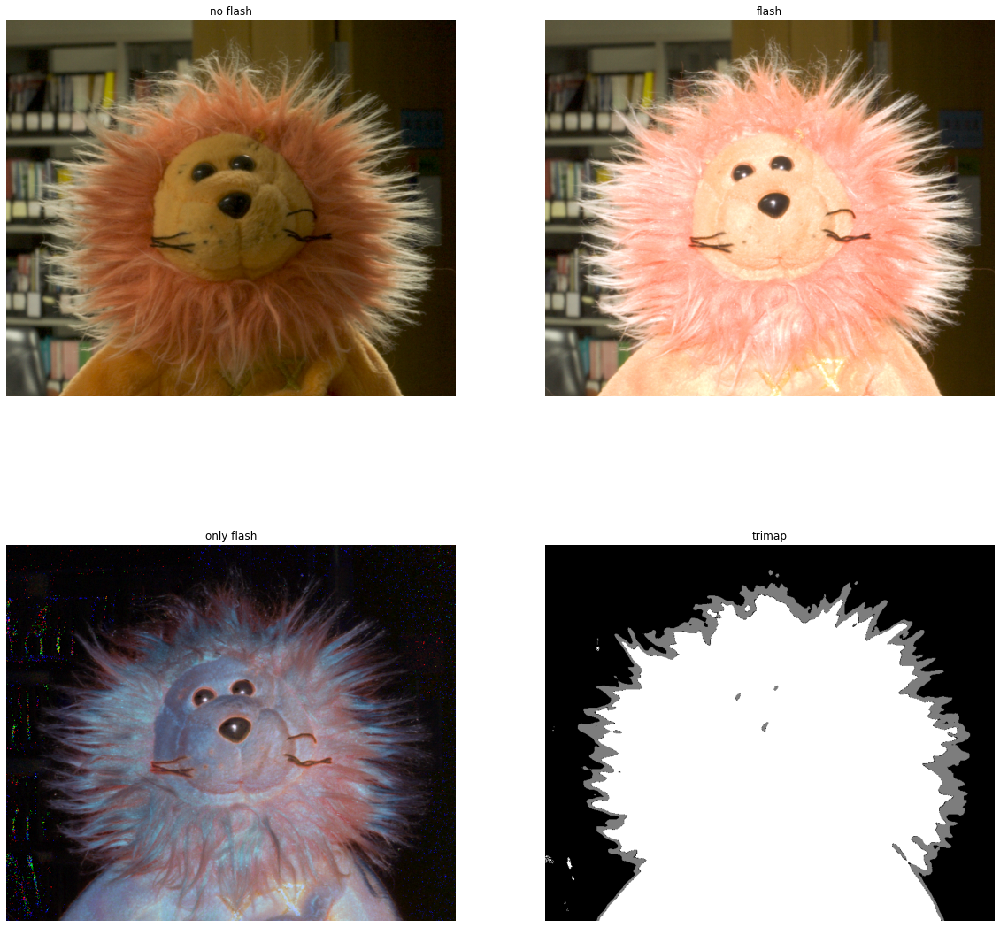

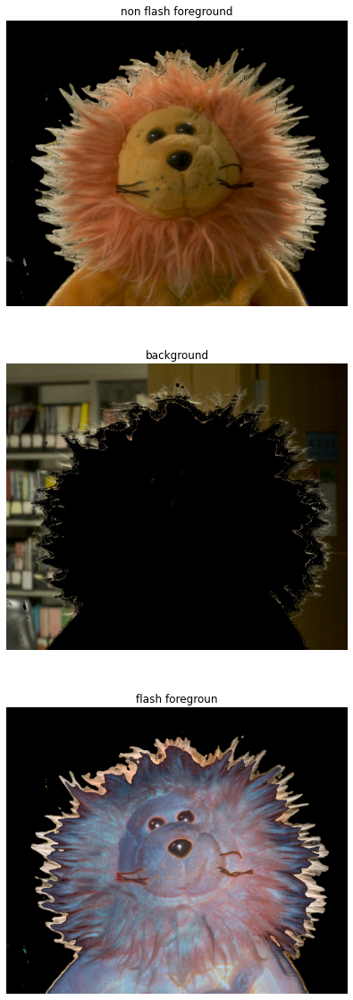

In [58]:
f,b,l,mask = run(2)
display_images([f,b,l],["non flash foreground","background","flash foregroun"],3,1)

(658, 785) (658, 785, 3)


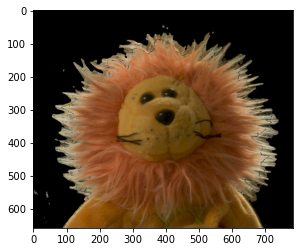

In [59]:
final_image = np.copy(f0)
print(mask.shape,final_image.shape)
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if(mask[i,j] <= 0.75):
            final_image[i,j,:] = 0
plt.imshow(final_image)

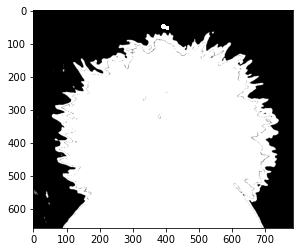

In [60]:
plt.imshow(mask,cmap = "gray")

In [61]:
cv2.imwrite("2.png",final_image)
cv2.imwrite("mask_2.png",mask)

True

Unsolve : 10292
PASS NUMBER : 1 , WINDOW SIZE : 19 , TO SOLVE : 10292
10292
PASS :  1
10291
WINDOW SIZE =  19
SOLVED LOCATIONS =  1
REMAINING LOCATIONS =  10291
---------------------------------------------
PASS :  1
10241
WINDOW SIZE =  19
SOLVED LOCATIONS =  51
REMAINING LOCATIONS =  10241
---------------------------------------------
PASS :  1
10191
WINDOW SIZE =  19
SOLVED LOCATIONS =  101
REMAINING LOCATIONS =  10191
---------------------------------------------
PASS :  1
10141
WINDOW SIZE =  19
SOLVED LOCATIONS =  151
REMAINING LOCATIONS =  10141
---------------------------------------------
PASS :  1
10091
WINDOW SIZE =  19
SOLVED LOCATIONS =  201
REMAINING LOCATIONS =  10091
---------------------------------------------
PASS :  1
10041
WINDOW SIZE =  19
SOLVED LOCATIONS =  251
REMAINING LOCATIONS =  10041
---------------------------------------------
PASS :  1
9991
WINDOW SIZE =  19
SOLVED LOCATIONS =  301
REMAINING LOCATIONS =  9991
--------------------------------------------

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3691
WINDOW SIZE =  19
SOLVED LOCATIONS =  6601
REMAINING LOCATIONS =  3691
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3641
WINDOW SIZE =  19
SOLVED LOCATIONS =  6651
REMAINING LOCATIONS =  3641
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3591
WINDOW SIZE =  19
SOLVED LOCATIONS =  6701
REMAINING LOCATIONS =  3591
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
3541
WINDOW SIZE =  19
SOLVED LOCATIONS =  6751
REMAINING LOCATIONS =  3541
---------------------------------------------
PASS :  1
3491
WINDOW SIZE =  19
SOLVED LOCATIONS =  6801
REMAINING LOCATIONS =  3491
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
3441
WINDOW SIZE =  19
SOLVED LOCATIONS =  6851
REMAINING LOCATIONS =  3441
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3391
WINDOW SIZE =  19
SOLVED LOCATIONS =  6901
REMAINING LOCATIONS =  3391
---------------------------------------------
PASS :  1
3341
WINDOW SIZE =  19
SOLVED LOCATIONS =  6951
REMAINING LOCATIONS =  3341
---------------------------------------------
PASS :  1
3291
WINDOW SIZE =  19
SOLVED LOCATIONS =  7001
REMAINING LOCATIONS =  3291
---------------------------------------------
PASS :  1
3241
WINDOW SIZE =  19
SOLVED LOCATIONS =  7051
REMAINING LOCATIONS =  3241
---------------------------------------------
PASS :  1
3191
WINDOW SIZE =  19
SOLVED LOCATIONS =  7101
REMAINING LOCATIONS =  3191
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
3141
WINDOW SIZE =  19
SOLVED LOCATIONS =  7151
REMAINING LOCATIONS =  3141
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3091
WINDOW SIZE =  19
SOLVED LOCATIONS =  7201
REMAINING LOCATIONS =  3091
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
3041
WINDOW SIZE =  19
SOLVED LOCATIONS =  7251
REMAINING LOCATIONS =  3041
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
2991
WINDOW SIZE =  19
SOLVED LOCATIONS =  7301
REMAINING LOCATIONS =  2991
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
2941
WINDOW SIZE =  19
SOLVED LOCATIONS =  7351
REMAINING LOCATIONS =  2941
---------------------------------------------
PASS :  1
2891
WINDOW SIZE =  19
SOLVED LOCATIONS =  7401
REMAINING LOCATIONS =  2891
---------------------------------------------
PASS :  1
2841
WINDOW SIZE =  19
SOLVED LOCATIONS =  7451
REMAINING LOCATIONS =  2841
---------------------------------------------
PASS :  1
2791
WINDOW SIZE =  19
SOLVED LOCATIONS =  7501
REMAINING LOCATIONS =  2791
---------------------------------------------
PASS :  1
2741
WINDOW SIZE =  19
SOLVED LOCATIONS =  7551
REMAINING LOCATIONS =  2741
---------------------------------------------
PASS :  1
2691
WINDOW SIZE =  19
SOLVED LOCATIONS =  7601
REMAINING LOCATIONS =  2691
---------------------------------------------
PASS :  1
2641
WINDOW SIZE =  19
SOLVED LOCATIONS =  7651
REMAINING LOCATIONS =  2641
---------------------------------------------
PASS :  1
2591
WINDOW SIZE =  19
SOLVED LOCATIONS =  7701
REMAINING LOCATION

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
1891
WINDOW SIZE =  19
SOLVED LOCATIONS =  8401
REMAINING LOCATIONS =  1891
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
1841
WINDOW SIZE =  19
SOLVED LOCATIONS =  8451
REMAINING LOCATIONS =  1841
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
1791
WINDOW SIZE =  19
SOLVED LOCATIONS =  8501
REMAINING LOCATIONS =  1791
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1741
WINDOW SIZE =  19
SOLVED LOCATIONS =  8551
REMAINING LOCATIONS =  1741
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1691
WINDOW SIZE =  19
SOLVED LOCATIONS =  8601
REMAINING LOCATIONS =  1691
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1641
WINDOW SIZE =  19
SOLVED LOCATIONS =  8651
REMAINING LOCATIONS =  1641
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1591
WINDOW SIZE =  19
SOLVED LOCATIONS =  8701
REMAINING LOCATIONS =  1591
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1541
WINDOW SIZE =  19
SOLVED LOCATIONS =  8751
REMAINING LOCATIONS =  1541
---------------------------------------------
PASS :  1
1491
WINDOW SIZE =  19
SOLVED LOCATIONS =  8801
REMAINING LOCATIONS =  1491
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1441
WINDOW SIZE =  19
SOLVED LOCATIONS =  8851
REMAINING LOCATIONS =  1441
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1391
WINDOW SIZE =  19
SOLVED LOCATIONS =  8901
REMAINING LOCATIONS =  1391
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1341
WINDOW SIZE =  19
SOLVED LOCATIONS =  8951
REMAINING LOCATIONS =  1341
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1291
WINDOW SIZE =  19
SOLVED LOCATIONS =  9001
REMAINING LOCATIONS =  1291
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1241
WINDOW SIZE =  19
SOLVED LOCATIONS =  9051
REMAINING LOCATIONS =  1241
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1191
WINDOW SIZE =  19
SOLVED LOCATIONS =  9101
REMAINING LOCATIONS =  1191
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
1141
WINDOW SIZE =  19
SOLVED LOCATIONS =  9151
REMAINING LOCATIONS =  1141
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3)

PASS :  1
1091
WINDOW SIZE =  19
SOLVED LOCATIONS =  9201
REMAINING LOCATIONS =  1091
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
1041
WINDOW SIZE =  19
SOLVED LOCATIONS =  9251
REMAINING LOCATIONS =  1041
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
991
WINDOW SIZE =  19
SOLVED LOCATIONS =  9301
REMAINING LOCATIONS =  991
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

PASS :  1
941
WINDOW SIZE =  19
SOLVED LOCATIONS =  9351
REMAINING LOCATIONS =  941
---------------------------------------------


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3)

Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
891
WINDOW SIZE =  19
SOLVED LOCATIONS =  9401
REMAINING LOCATIONS =  891
------------------------------------

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
791
WINDOW SIZE =  19
SOLVED LOCATIONS =  9501
REMAINING LOCATIONS =  791
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
741
WINDOW SIZE =  19
SOLVED LOCATIONS =  9551
REMAINING LOCATIONS =  741
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
691
WINDOW SIZE =  19
SOLVED LOCATIONS =  9601
REMAINING LOCATIONS =  691
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
641
WINDOW SIZE =  19
SOLVED LOCATIONS =  9651
REMAINING LOCATIONS =  641
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
591
WINDOW SIZE =  19
SOLVED LOCATIONS =  9701
REMAINING LOCATIONS =  591
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
541
WINDOW SIZE =  19
SOLVED LOCATIONS =  9751
REMAINING LOCATIONS =  541
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
491
WINDOW SIZE =  19
SOLVED LOCATIONS =  9801
REMAINING LOCATIONS =  491
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
441
WINDOW SIZE =  19
SOLVED LOCATIONS =  9851
REMAINING LOCATIONS =  441
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
391
WINDOW SIZE =  19
SOLVED LOCATIONS =  9901
REMAINING LOCATIONS =  391
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
341
WINDOW SIZE =  19
SOLVED LOCATIONS =  9951
REMAINING LOCATIONS =  341
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
291
WINDOW SIZE =  19
SOLVED LOCATIONS =  10001
REMAINING LOCATIONS =  291
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing nei

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
PASS :  1
241
WINDOW SIZE =  19
SOLVED LOCATIONS =  10051
REMAINING LOCATIONS =  241
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS :  1
191
WINDOW SIZE =  19
SOLVED LOCATIONS =  10101
REMAINING LOCATIONS =  191
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: invalid value encountered in double_scalars
  alpha = num / den
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing ne

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<i

Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: invalid value encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


PASS :  1
41
WINDOW SIZE =  19
SOLVED LOCATIONS =  10251
REMAINING LOCATIONS =  41
---------------------------------------------
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neigh

<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: invalid value encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-53-a8fe459aa74b>:111: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = num / den


Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood
Invalid indexes for computing neighbourhood


<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),
<ipython-input-52-ede0654d1681>:9: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  clusters = KMeans(n_init = 5, n_clusters = num_cluster , random_state = 0).fit(pixels)
<ipython-input-52-ede0654d1681>:19: RuntimeWarning: invalid value encountered in true_divide
  meanbin = np.array([np.dot(this_pixels[:,0], kernel_bin),np.dot(this_pixels[:,1], kernel_bin),


PASS NUMBER : 2 , WINDOW SIZE : 19 , TO SOLVE : 22
22
PASS NUMBER : 3 , WINDOW SIZE : 19 , TO SOLVE : 22
22
PASS NUMBER : 4 , WINDOW SIZE : 19 , TO SOLVE : 22
22
PASS NUMBER : 5 , WINDOW SIZE : 19 , TO SOLVE : 22
22
PASS NUMBER : 6 , WINDOW SIZE : 19 , TO SOLVE : 22
22
PASS NUMBER : 7 , WINDOW SIZE : 21 , TO SOLVE : 22
22
PASS NUMBER : 8 , WINDOW SIZE : 23 , TO SOLVE : 22
22
PASS NUMBER : 9 , WINDOW SIZE : 23 , TO SOLVE : 22
22
PASS NUMBER : 10 , WINDOW SIZE : 25 , TO SOLVE : 22
22
SOLVER COMPLETED IN  10273 ITERATIONS
---------------------------------------------
---------------------------------------------
---------------------------------------------
Time taken : 641.2690465450287


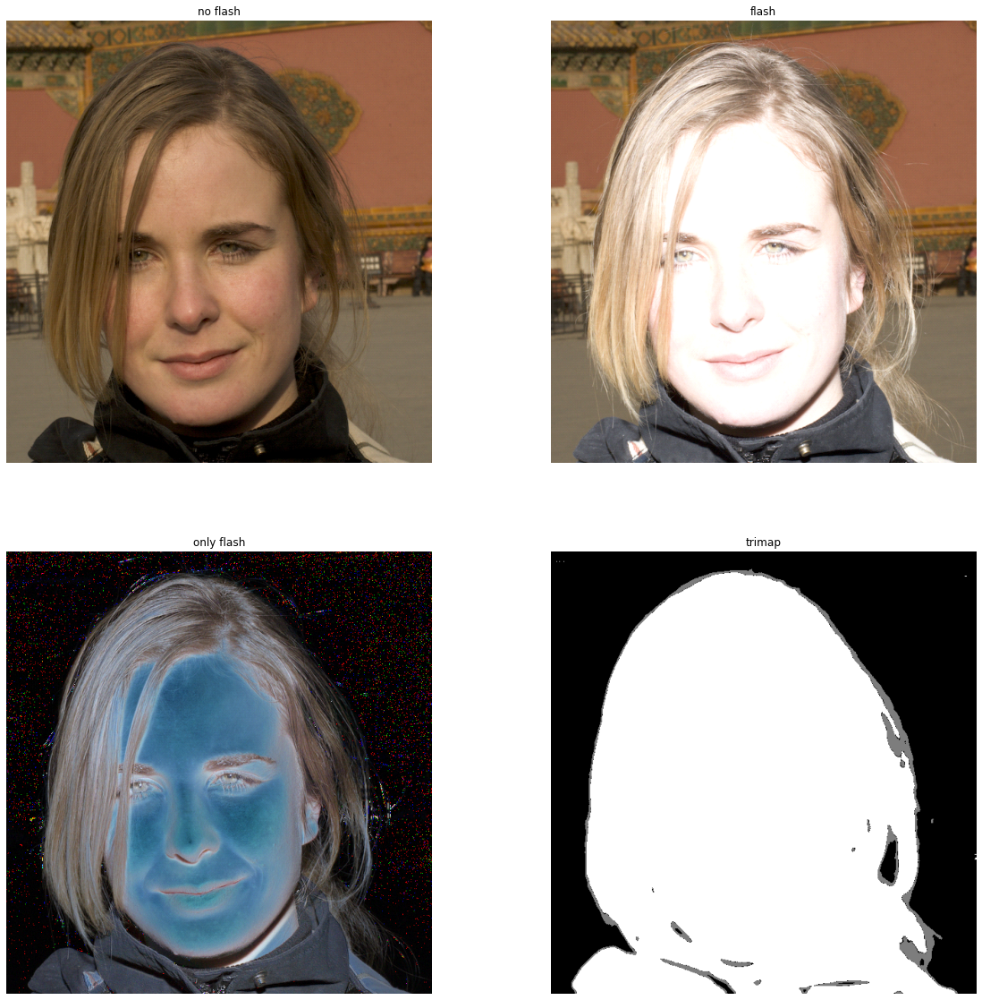

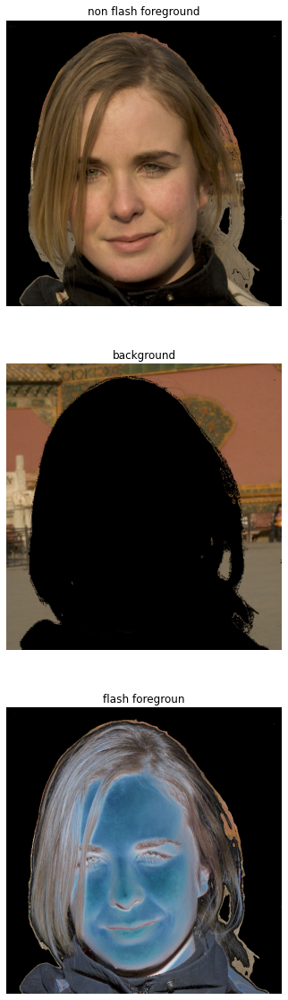

In [62]:
f,b,l,mask = run(3)
display_images([f,b,l],["non flash foreground","background","flash foregroun"],3,1)

(631, 607) (631, 607, 3)


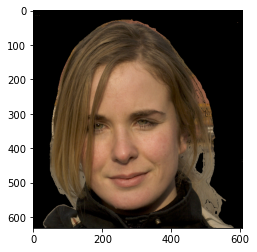

In [68]:
final_image = np.copy(f)
print(mask.shape,final_image.shape)
for i in range(mask.shape[0]):
    for j in range(mask.shape[1]):
        if(mask[i,j] <= 0.75):
            final_image[i,j,:] = 0
plt.imshow(f)

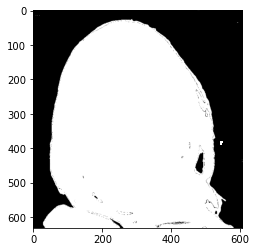

In [64]:
plt.imshow(mask,cmap = "gray")

In [70]:
cv2.imwrite("3.png",cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR))
cv2.imwrite("mask_3.png",mask)

True